## INTRODUCTION
### We have a data which classified if Customer can have a Loan or not according to features in it. We will try to use this data to create a model which tries predict if a Customer has this Loan or not. We will use logistic regression (classification) algorithm ,And Feature Engineering

## Import Library

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
%matplotlib inline

In [2]:
df= pd.read_csv('bank-full.csv',sep=';')

In [3]:
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [4]:
pd.options.display.max_columns = 500

In [5]:
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


## Intial Details Of Data

In [6]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB
None


In [7]:
df.dtypes

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object

In [8]:
duplicate = df[df.duplicated(keep = 'first')]
print("Duplicate Rows :")
duplicate

Duplicate Rows :


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y


In [9]:
df.isna().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

### There is no Null value in Entire data

<AxesSubplot:>

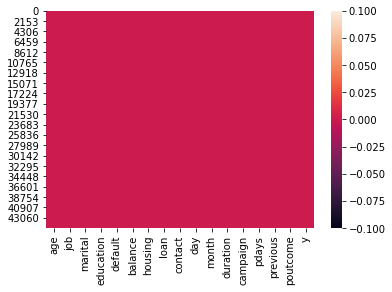

In [10]:
sns.heatmap(df.isnull())

### To find unique features from all the entire DAta set

In [11]:

category_features = df.select_dtypes(include=['object', 'bool']).columns.values
print('category_features :' ,category_features ,'\n')


category_features : ['job' 'marital' 'education' 'default' 'housing' 'loan' 'contact' 'month'
 'poutcome' 'y'] 



In [12]:
for column in category_features:
 print(column,'--' ,len(df[column].unique()),'values:\n',df[column].value_counts())

job -- 12 values:
 blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64
marital -- 3 values:
 married     27214
single      12790
divorced     5207
Name: marital, dtype: int64
education -- 4 values:
 secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64
default -- 2 values:
 no     44396
yes      815
Name: default, dtype: int64
housing -- 2 values:
 yes    25130
no     20081
Name: housing, dtype: int64
loan -- 2 values:
 no     37967
yes     7244
Name: loan, dtype: int64
contact -- 3 values:
 cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64
month -- 12 values:
 may    13766
jul     6895
aug     6247
jun     5341
nov     3970
apr     2932
feb     2649
jan     1403
oct  

In [13]:
for column in category_features:
    print(df[column].value_counts(),'\n')
    



blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64 

married     27214
single      12790
divorced     5207
Name: marital, dtype: int64 

secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64 

no     44396
yes      815
Name: default, dtype: int64 

yes    25130
no     20081
Name: housing, dtype: int64 

no     37967
yes     7244
Name: loan, dtype: int64 

cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64 

may    13766
jul     6895
aug     6247
jun     5341
nov     3970
apr     2932
feb     2649
jan     1403
oct      738
sep      579
mar      477
dec      214
Name: month, dtype: int64 

unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome

## EDA

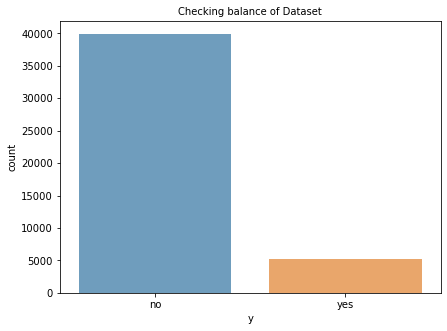

In [14]:
#The number of Sub(yes/no) users - Binary Yes/No, Checking balanced Dataset
plt.rcParams['figure.figsize']=15,5
plt.subplot(121)
plt.title('Checking balance of Dataset', fontsize=10)
s = sns.countplot(x="y", data=df, alpha=0.7)

In [15]:
df['y'].value_counts()

no     39922
yes     5289
Name: y, dtype: int64

([<matplotlib.patches.Wedge at 0x1d43112a6a0>,
 [Text(0.6913977395353113, -0.8555519655552561, 'No'),
  Text(-0.6913977996122266, 0.8555519170052578, 'Yes')],
 [Text(0.3771260397465334, -0.4666647084846851, '88.3%'),
  Text(-0.3771260725157599, 0.4666646820028678, '11.7%')])

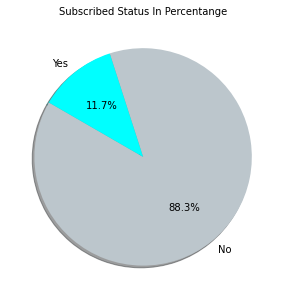

In [16]:
pie = df['y'].value_counts()
size = pie.values.tolist()
types = pie.axes[0].tolist()
labels = 'No', 'Yes'
colors = ['#BCC6CC', '#00FFFF']
plt.title('Subscribed Status In Percentange', fontsize=10)
plt.pie(size, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=150)

In [17]:
df['education'].value_counts()

secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64

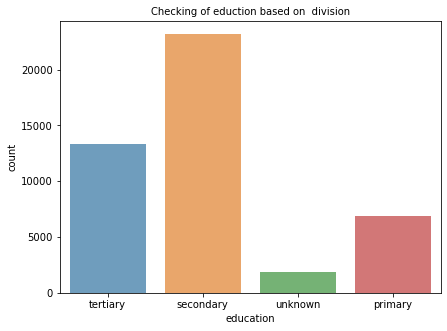

In [18]:
plt.rcParams['figure.figsize']=15,5
plt.subplot(121)
plt.title('Checking of eduction based on  division', fontsize=10)
s = sns.countplot(x="education", data=df, alpha=0.7)

In [19]:
df_pivot=pd.pivot_table(df,columns='education',index='y')
df_pivot.transpose()

y                            no          yes
         education                          
age      primary      45.323482    51.607445
         secondary    39.883192    40.651020
         tertiary     39.608226    39.511022
         unknown      44.375078    45.373016
balance  primary    1193.956230  1854.639594
         secondary  1114.160804  1499.787347
         tertiary   1696.502963  2109.083667
         unknown    1416.019938  2232.027778
campaign primary       2.886581     2.280880
         secondary     2.773612     2.084082
         tertiary      2.939938     2.177856
         unknown       2.970717     2.075397
day      primary      15.401757    15.629442
         secondary    15.844690    15.034694
         tertiary     16.266431    15.067635
         unknown      15.785670    15.972222
duration primary     220.470447   631.560068
         secondary   223.362086   557.884490
         tertiary    217.053516   493.369238
         unknown     224.869159   463.956349
pdays    primary      34.158946    56.448393
         secondary    38.976388    70.958367
         tertiary     33.710571    69.119238
         unknown      31.304050    72.218254
previous primary       0.434984     1.064298
         secondary     0.499904     1.142449
         tertiary      0.557541     1.253507
         unknown       0.403115     1.031746

In [20]:
df_pivot=pd.pivot_table(df,columns='education',index='y')
df_pivot.transpose()

y                            no          yes
         education                          
age      primary      45.323482    51.607445
         secondary    39.883192    40.651020
         tertiary     39.608226    39.511022
         unknown      44.375078    45.373016
balance  primary    1193.956230  1854.639594
         secondary  1114.160804  1499.787347
         tertiary   1696.502963  2109.083667
         unknown    1416.019938  2232.027778
campaign primary       2.886581     2.280880
         secondary     2.773612     2.084082
         tertiary      2.939938     2.177856
         unknown       2.970717     2.075397
day      primary      15.401757    15.629442
         secondary    15.844690    15.034694
         tertiary     16.266431    15.067635
         unknown      15.785670    15.972222
duration primary     220.470447   631.560068
         secondary   223.362086   557.884490
         tertiary    217.053516   493.369238
         unknown     224.869159   463.956349
pdays    primary      34.158946    56.448393
         secondary    38.976388    70.958367
         tertiary     33.710571    69.119238
         unknown      31.304050    72.218254
previous primary       0.434984     1.064298
         secondary     0.499904     1.142449
         tertiary      0.557541     1.253507
         unknown       0.403115     1.031746

Text(0.5, 0, '---Job---')

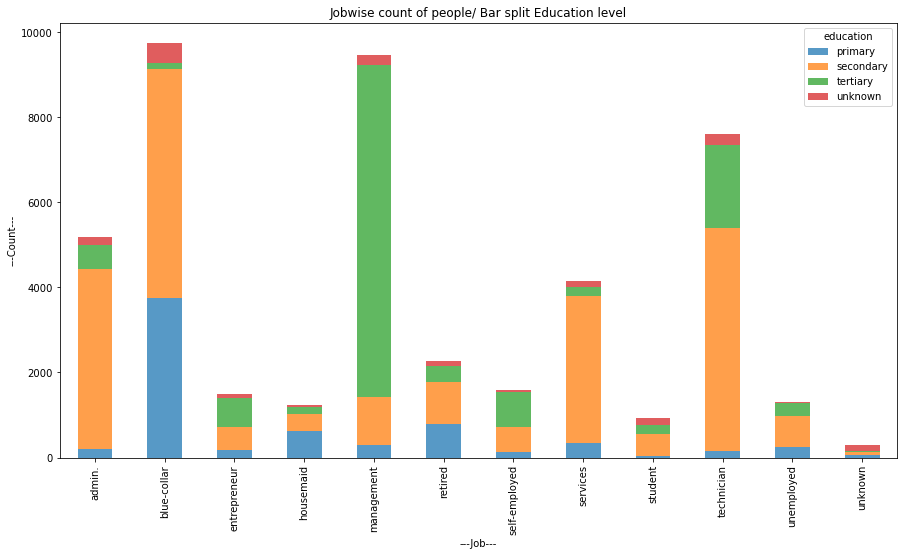

In [21]:
#barplot of job with bars split by education
#pivot table to get jobs as index and education as column. count of 'age' are the values
df_pivot = pd.pivot_table(df,columns='education', index='job', aggfunc='count',values='age')
df_pivot.plot(kind='bar',stacked=True, figsize=(15,8), alpha=0.75)
plt.title('Jobwise count of people/ Bar split Education level')
plt.ylabel('---Count---')
plt.xlabel('---Job---')

In [22]:
eduction_y=df.value_counts(["education", "y"])
eduction_y

education  y  
secondary  no     20752
tertiary   no     11305
primary    no      6260
secondary  yes     2450
tertiary   yes     1996
unknown    no      1605
primary    yes      591
unknown    yes      252
dtype: int64

Text(0.5, 0, '---Education--')

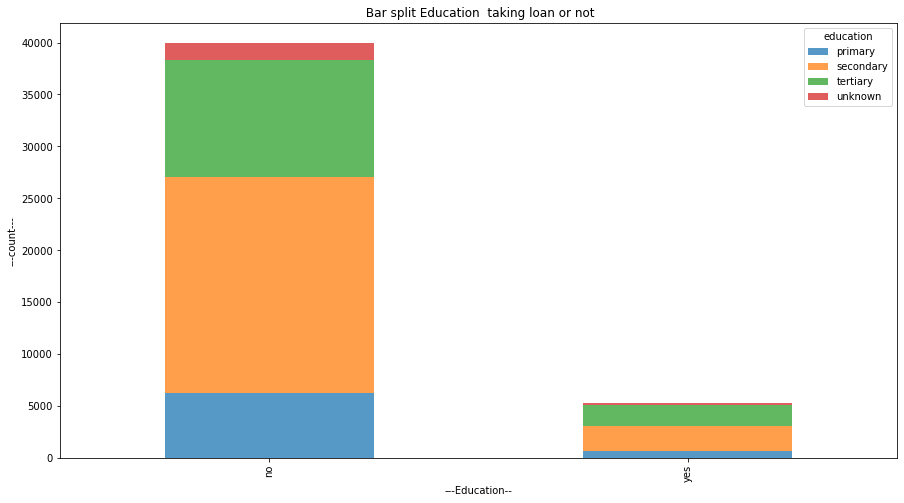

In [23]:
df_pivot = pd.pivot_table(df,columns='education', index='y', aggfunc='count',values='age')
df_pivot.plot(kind='bar',stacked=True, figsize=(15,8), alpha=0.75)
plt.title(' Bar split Education  taking loan or not')
plt.ylabel('---count---')
plt.xlabel('---Education--')

In [24]:
category_features

array(['job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'poutcome', 'y'], dtype=object)

In [25]:
df['job'].value_counts()

blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

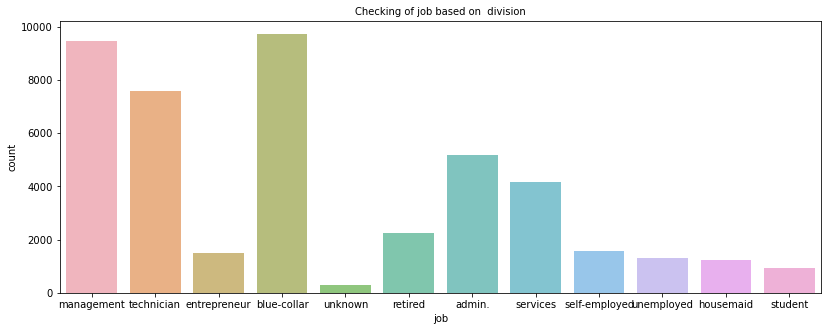

In [26]:
plt.rcParams['figure.figsize']=30,5
plt.subplot(121)
plt.title('Checking of job based on  division', fontsize=10)
s = sns.countplot(x="job", data=df, alpha=0.7)

In [27]:
df['marital'].value_counts()

married     27214
single      12790
divorced     5207
Name: marital, dtype: int64

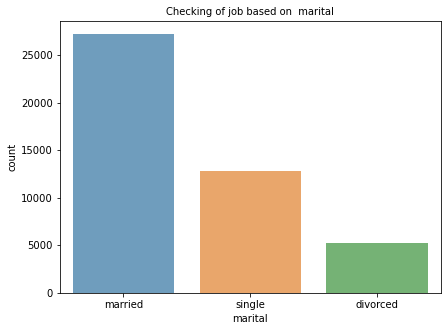

In [28]:
plt.rcParams['figure.figsize']=15,5
plt.subplot(121)
plt.title('Checking of job based on  marital', fontsize=10)
s = sns.countplot(x="marital", data=df, alpha=0.7)

In [29]:
df['housing'].value_counts()

yes    25130
no     20081
Name: housing, dtype: int64

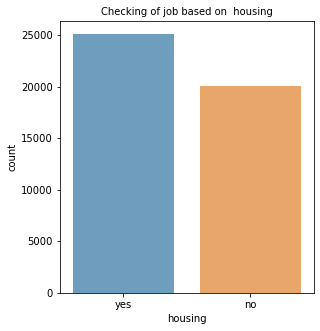

In [30]:
plt.rcParams['figure.figsize']=10,5
plt.subplot(121)
plt.title('Checking of job based on  housing', fontsize=10)
s = sns.countplot(x="housing", data=df, alpha=0.7)

Text(0.5, 0, '---loan--')

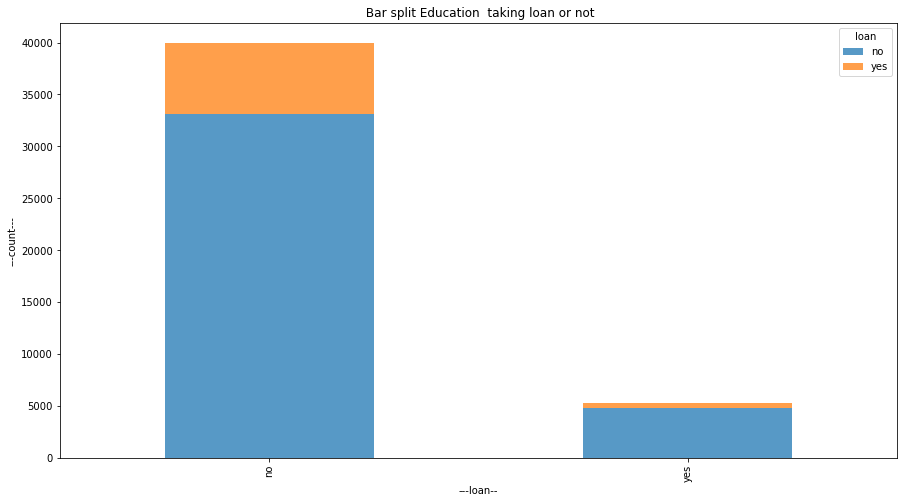

In [31]:
df_pivot = pd.pivot_table(df,columns='loan', index='y', aggfunc='count',values='age')
df_pivot.plot(kind='bar',stacked=True, figsize=(15,8), alpha=0.75)
plt.title(' Bar split Education  taking loan or not')
plt.ylabel('---count---')
plt.xlabel('---loan--')

Text(0.5, 1.0, 'y')

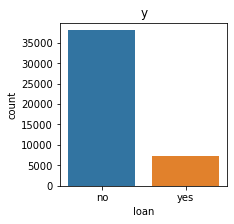

In [32]:

 plt.figure(figsize=(3,3)) 
 sns.countplot(x='loan',data=df) 
 plt.title(column) 

Text(0.5, 1.0, 'y')

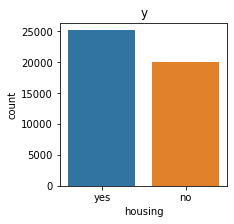

In [33]:
plt.figure(figsize=(3,3)) 
sns.countplot(x='housing',data=df) 
plt.title(column)

Text(0.5, 1.0, 'y')

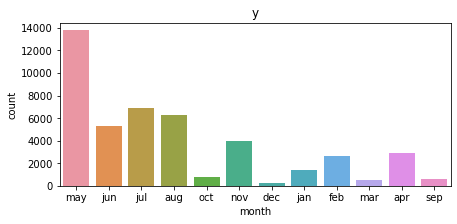

In [34]:
plt.figure(figsize=(7,3)) 
sns.countplot(x='month',data=df) 
plt.title(column)

Text(0.5, 1.0, 'y')

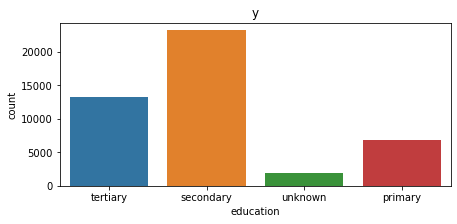

In [35]:
plt.figure(figsize=(7,3)) 
sns.countplot(x='education',data=df) 
plt.title(column)

In [36]:
category_features

array(['job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'poutcome', 'y'], dtype=object)

Text(0.5, 1.0, 'y')

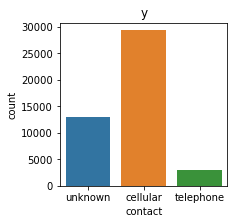

In [37]:
plt.figure(figsize=(3,3)) 
sns.countplot(x='contact',data=df) 
plt.title(column)

In [38]:
df.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [39]:
df.corr(method='pearson')

,age,balance,day,duration,campaign,pdays,previous
age,1.000000,0.097783,-0.009120,-0.004648,0.004760,-0.023758,0.001288
balance,0.097783,1.000000,0.004503,0.021560,-0.014578,0.003435,0.016674
day,-0.009120,0.004503,1.000000,-0.030206,0.162490,-0.093044,-0.051710
duration,-0.004648,0.021560,-0.030206,1.000000,-0.084570,-0.001565,0.001203
campaign,0.004760,-0.014578,0.162490,-0.084570,1.000000,-0.088628,-0.032855
pdays,-0.023758,0.003435,-0.093044,-0.001565,-0.088628,1.000000,0.454820
previous,0.001288,0.016674,-0.051710,0.001203,-0.032855,0.454820,1.000000


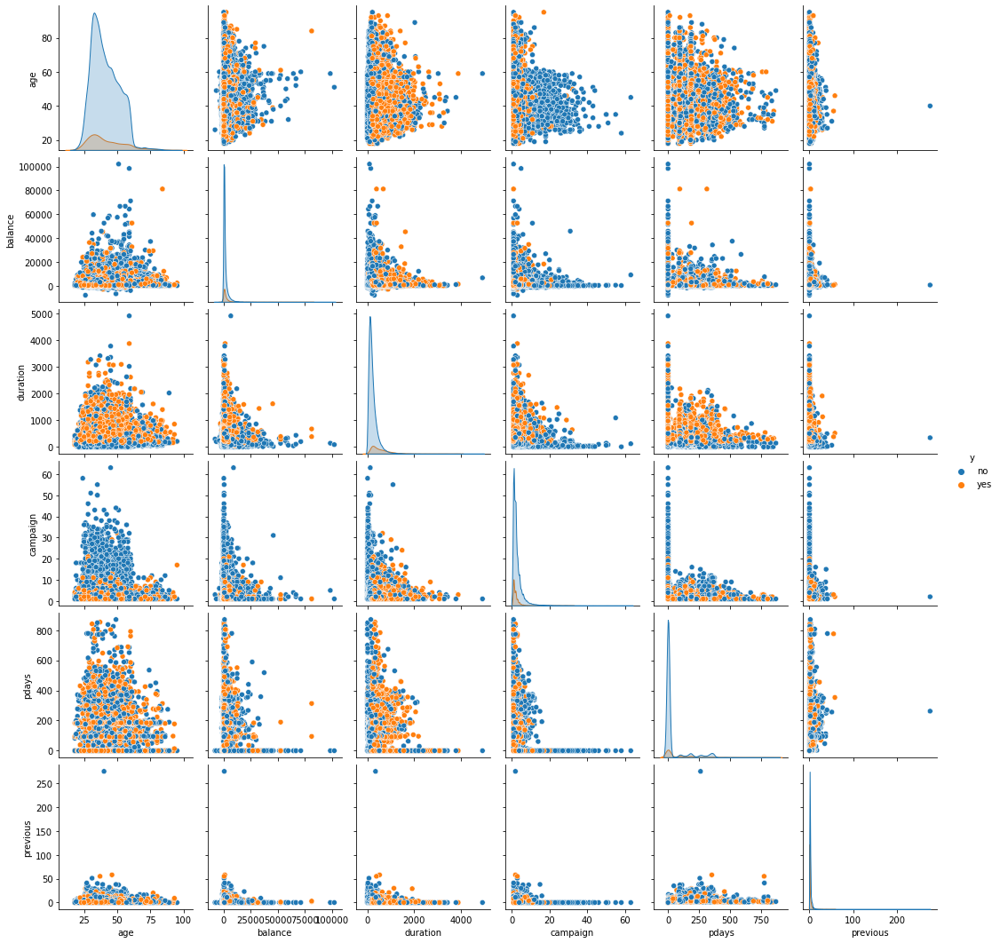

In [40]:
sns.pairplot(data=df, hue='y', vars= ['age', 'balance', 'duration','campaign','pdays','previous'])

<AxesSubplot:>

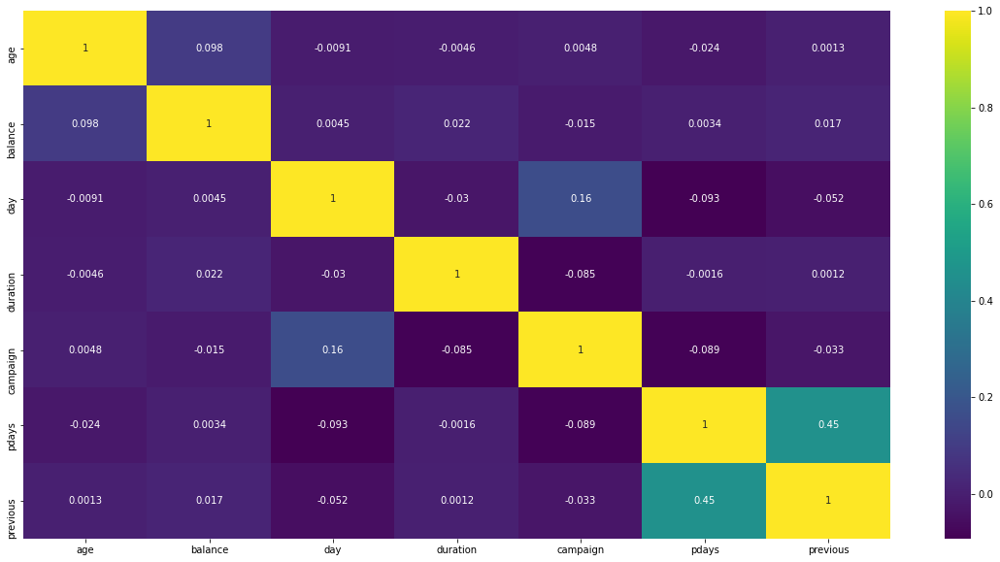

In [41]:
plt.figure(figsize=(20,10))
sns.heatmap(data=df.corr(), annot=True, cmap='viridis')

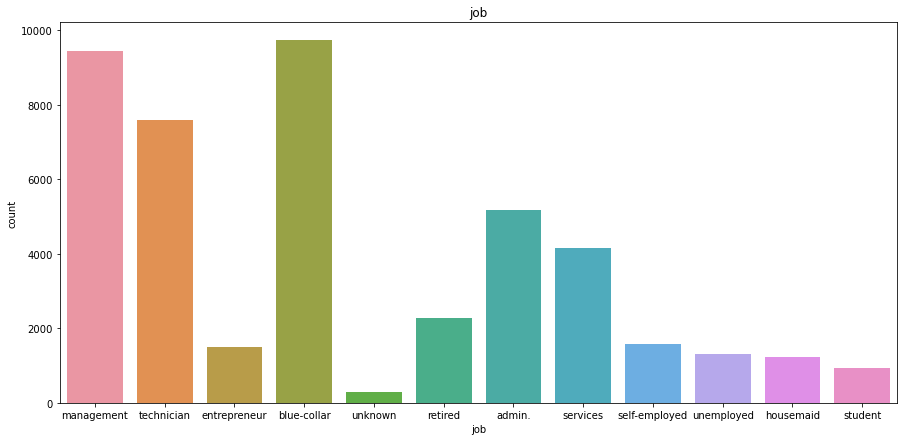

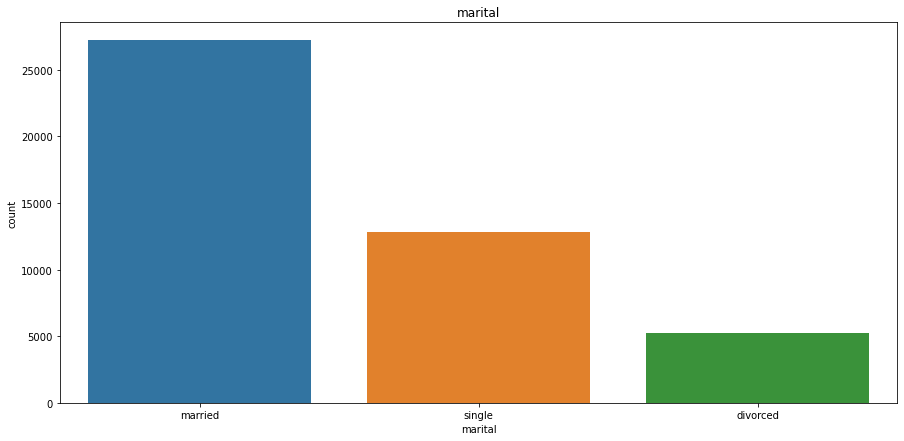

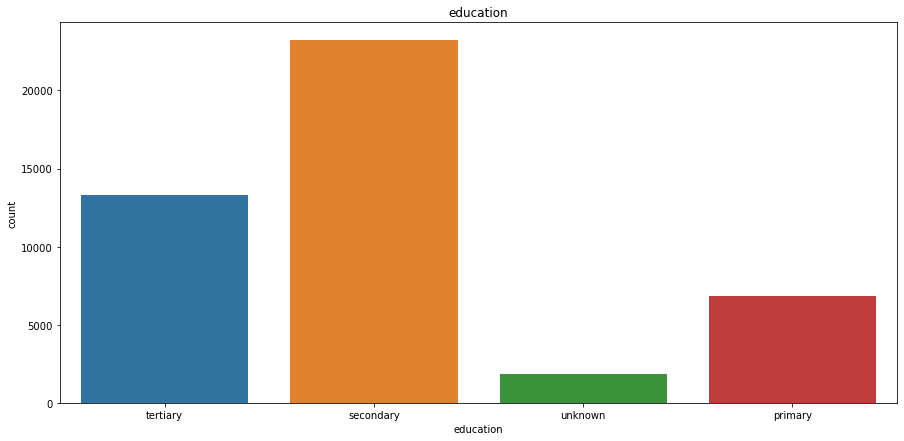

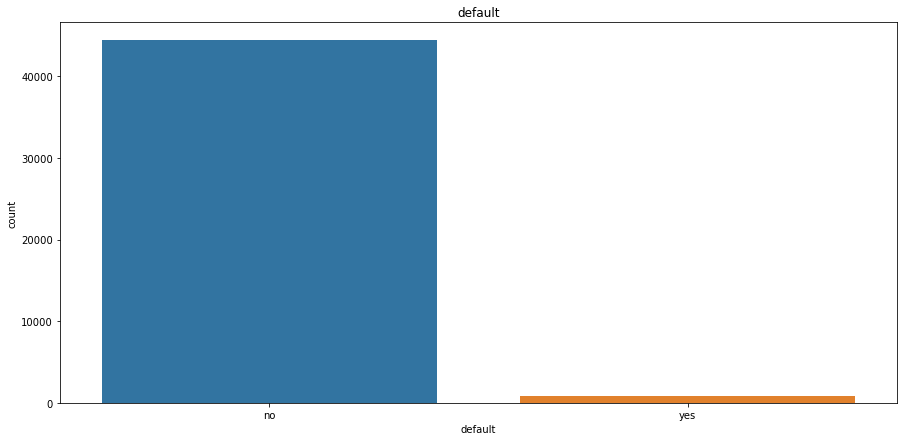

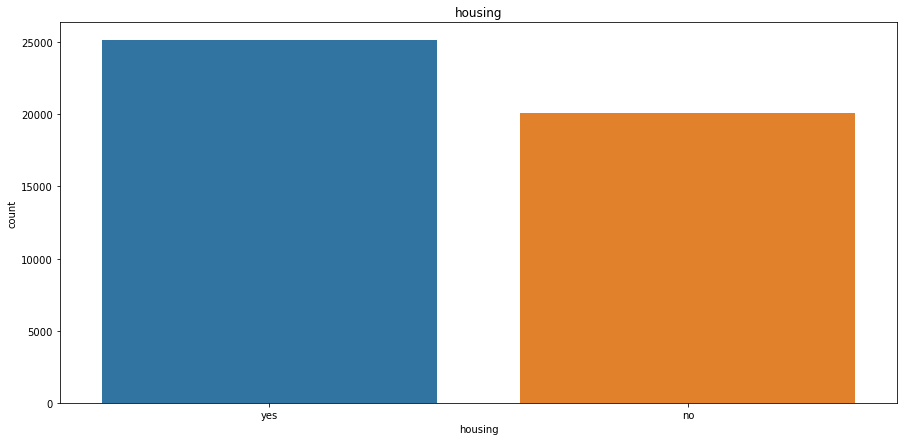

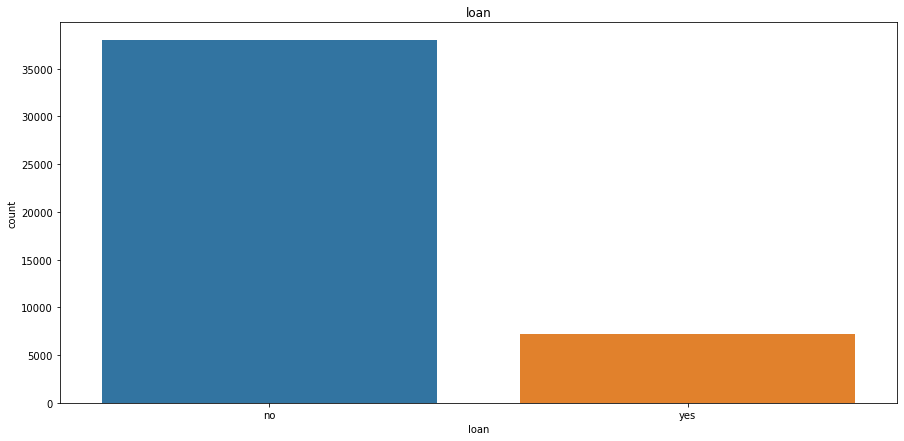

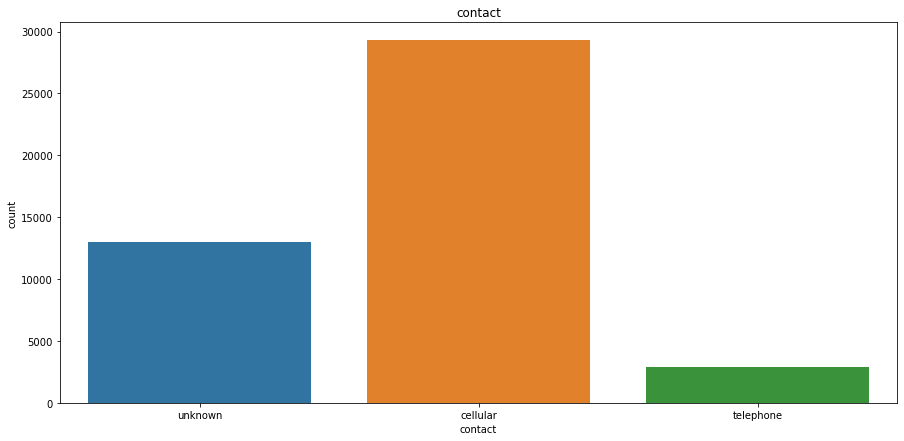

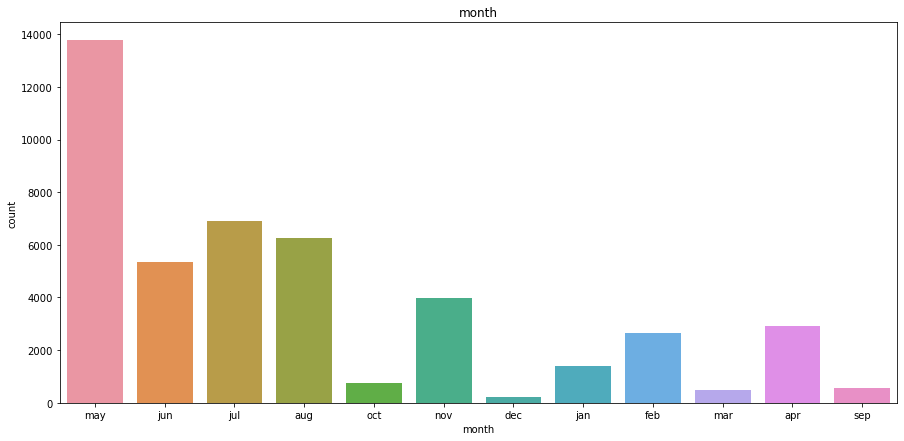

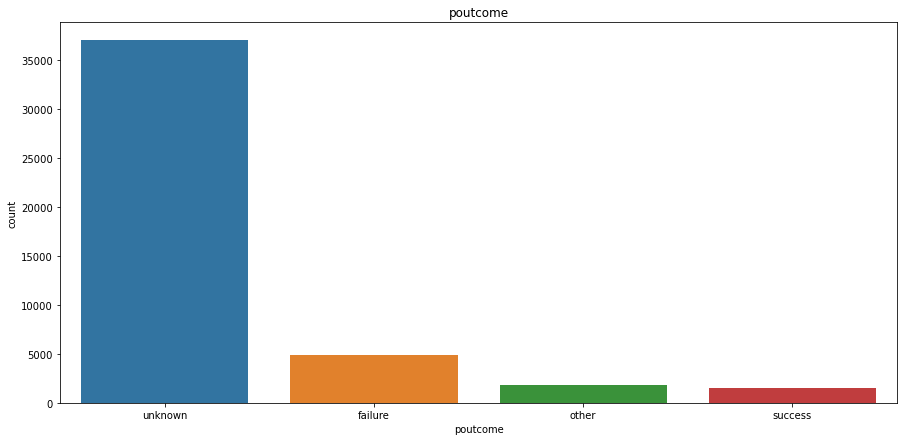

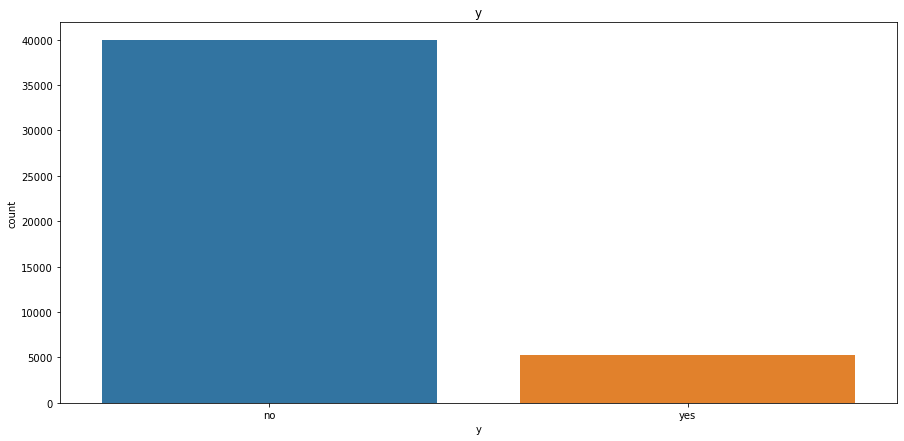

In [42]:
for column in category_features:
 plt.figure(figsize=(15,7)) 
 sns.countplot(x=df[column],data=df) 
 plt.title(column) 

## Insights:

### 1.Married leads have made high deposits followed by single
### 2.There were much deposist made during may month as it is the start of bank period
### 3.Leads who work in administrative position made deposits followed by technicians and blue collar employees
### 4.Leads who had atleast university degree had made te deposits followed by highschool

In [43]:
import plotly.express as px
fig=px.scatter(df, x="campaign", y="duration", color="y")
fig.show()

In [44]:
px.scatter_3d(df,x='balance',y='job',z='loan',color='y')

## Transforming the data 

In [45]:
# Step 4: Change 'month' from words to numbers for easier analysis
lst = [df]
for column in lst:
    column.loc[column["month"] == "jan", "month_int"] = 1
    column.loc[column["month"] == "feb", "month_int"] = 2
    column.loc[column["month"] == "mar", "month_int"] = 3
    column.loc[column["month"] == "apr", "month_int"] = 4
    column.loc[column["month"] == "may", "month_int"] = 5
    column.loc[column["month"] == "jun", "month_int"] = 6
    column.loc[column["month"] == "jul", "month_int"] = 7
    column.loc[column["month"] == "aug", "month_int"] = 8
    column.loc[column["month"] == "sep", "month_int"] = 9
    column.loc[column["month"] == "oct", "month_int"] = 10
    column.loc[column["month"] == "nov", "month_int"] = 11
    column.loc[column["month"] == "dec", "month_int"] = 12

In [46]:
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,month_int
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,5.0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,5.0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no,5.0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no,5.0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no,5.0


In [47]:
df.drop(['month'],axis=1)

,age,job,marital,education,default,balance,housing,loan,contact,day,duration,campaign,pdays,previous,poutcome,y,month_int
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,261,1,-1,0,unknown,no,5.0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,151,1,-1,0,unknown,no,5.0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,76,1,-1,0,unknown,no,5.0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,92,1,-1,0,unknown,no,5.0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,198,1,-1,0,unknown,no,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,977,3,-1,0,unknown,yes,11.0
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,456,2,-1,0,unknown,yes,11.0
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,1127,5,184,3,success,yes,11.0
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,508,4,-1,0,unknown,no,11.0


In [48]:
df2= df.copy()

In [49]:
df2.drop(['month'],axis=1,inplace=True)

In [50]:
df2

,age,job,marital,education,default,balance,housing,loan,contact,day,duration,campaign,pdays,previous,poutcome,y,month_int
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,261,1,-1,0,unknown,no,5.0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,151,1,-1,0,unknown,no,5.0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,76,1,-1,0,unknown,no,5.0
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,92,1,-1,0,unknown,no,5.0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,198,1,-1,0,unknown,no,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,977,3,-1,0,unknown,yes,11.0
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,456,2,-1,0,unknown,yes,11.0
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,1127,5,184,3,success,yes,11.0
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,508,4,-1,0,unknown,no,11.0


In [51]:
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
category_features=['job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'poutcome', 'y']
for i in category_features:
    df2[i]=LE.fit_transform(df2[i])
    
df2.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,duration,campaign,pdays,previous,poutcome,y,month_int
0,58,4,1,2,0,2143,1,0,2,5,261,1,-1,0,3,0,5.0
1,44,9,2,1,0,29,1,0,2,5,151,1,-1,0,3,0,5.0
2,33,2,1,1,0,2,1,1,2,5,76,1,-1,0,3,0,5.0
3,47,1,1,3,0,1506,1,0,2,5,92,1,-1,0,3,0,5.0
4,33,11,2,3,0,1,0,0,2,5,198,1,-1,0,3,0,5.0


In [52]:
df2.tail()

,age,job,marital,education,default,balance,housing,loan,contact,day,duration,campaign,pdays,previous,poutcome,y,month_int
45206,51,9,1,2,0,825,0,0,0,17,977,3,-1,0,3,1,11.0
45207,71,5,0,0,0,1729,0,0,0,17,456,2,-1,0,3,1,11.0
45208,72,5,1,1,0,5715,0,0,0,17,1127,5,184,3,2,1,11.0
45209,57,1,1,1,0,668,0,0,1,17,508,4,-1,0,3,0,11.0
45210,37,2,1,1,0,2971,0,0,0,17,361,2,188,11,1,0,11.0


In [53]:
df2.dtypes

age            int64
job            int32
marital        int32
education      int32
default        int32
balance        int64
housing        int32
loan           int32
contact        int32
day            int64
duration       int64
campaign       int64
pdays          int64
previous       int64
poutcome       int32
y              int32
month_int    float64
dtype: object

In [54]:
df3=df2.rename(columns={'y':'Subscription'})

In [55]:
df3.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,duration,campaign,pdays,previous,poutcome,Subscription,month_int
0,58,4,1,2,0,2143,1,0,2,5,261,1,-1,0,3,0,5.0
1,44,9,2,1,0,29,1,0,2,5,151,1,-1,0,3,0,5.0
2,33,2,1,1,0,2,1,1,2,5,76,1,-1,0,3,0,5.0
3,47,1,1,3,0,1506,1,0,2,5,92,1,-1,0,3,0,5.0
4,33,11,2,3,0,1,0,0,2,5,198,1,-1,0,3,0,5.0


In [56]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   age           45211 non-null  int64  
 1   job           45211 non-null  int32  
 2   marital       45211 non-null  int32  
 3   education     45211 non-null  int32  
 4   default       45211 non-null  int32  
 5   balance       45211 non-null  int64  
 6   housing       45211 non-null  int32  
 7   loan          45211 non-null  int32  
 8   contact       45211 non-null  int32  
 9   day           45211 non-null  int64  
 10  duration      45211 non-null  int64  
 11  campaign      45211 non-null  int64  
 12  pdays         45211 non-null  int64  
 13  previous      45211 non-null  int64  
 14  poutcome      45211 non-null  int32  
 15  Subscription  45211 non-null  int32  
 16  month_int     45211 non-null  float64
dtypes: float64(1), int32(9), int64(7)
memory usage: 4.3 MB


## now all data are converted into numerical categories

## Feature selection

In [57]:
x= df3.drop(['Subscription'],axis=1)
y= df3[['Subscription']]

In [58]:
df3.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,duration,campaign,pdays,previous,poutcome,Subscription,month_int
0,58,4,1,2,0,2143,1,0,2,5,261,1,-1,0,3,0,5.0
1,44,9,2,1,0,29,1,0,2,5,151,1,-1,0,3,0,5.0
2,33,2,1,1,0,2,1,1,2,5,76,1,-1,0,3,0,5.0
3,47,1,1,3,0,1506,1,0,2,5,92,1,-1,0,3,0,5.0
4,33,11,2,3,0,1,0,0,2,5,198,1,-1,0,3,0,5.0


In [59]:
x.shape,y.shape

((45211, 16), (45211, 1))

## Training the data

In [60]:
X_train,X_test,y_train,y_test = train_test_split(x,y,test_size=0.20,random_state=123,shuffle=True)

In [61]:
X_train.shape,y_train.shape #Training samples

((36168, 16), (36168, 1))

In [62]:
X_test.shape,y_test.shape #Test samples

((9043, 16), (9043, 1))

## model training

In [63]:
import warnings
warnings.filterwarnings('ignore')

In [64]:
logistic_model = LogisticRegression(penalty='l1',solver='liblinear')

In [65]:
%%time
logistic_model.fit(X_train,y_train)

Wall time: 918 ms


LogisticRegression(penalty='l1', solver='liblinear')

In [66]:
logistic_model.coef_

array([[ 7.90917586e-03,  7.16506019e-03,  2.24456879e-01,
         2.11072695e-01, -3.94936539e-01,  1.97868699e-05,
        -9.99612368e-01, -6.68974481e-01, -6.04864437e-01,
        -4.36253671e-03,  3.89834204e-03, -1.46982298e-01,
         3.54905476e-03,  8.86537302e-02,  2.02513029e-01,
        -1.28165964e-02]])

In [67]:
logistic_model.get_params(deep=True)

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l1',
 'random_state': None,
 'solver': 'liblinear',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [68]:
logistic_model.intercept_

array([-3.70849133])

In [69]:
logistic_model.class_weight

## Model Testing || 8. Model Evaluation
Training Accuracy

In [70]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_auc_score,roc_curve

In [71]:
y_pred_train = logistic_model.predict(X_train)

In [72]:
accuracy_score(y_train,y_pred_train)

0.8912298164122981

In [73]:
confusion_matrix(y_train,y_pred_train)

array([[31327,   609],
       [ 3325,   907]], dtype=int64)

In [74]:
print(classification_report(y_train,y_pred_train))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94     31936
           1       0.60      0.21      0.32      4232

    accuracy                           0.89     36168
   macro avg       0.75      0.60      0.63     36168
weighted avg       0.87      0.89      0.87     36168



In [75]:
roc_curve(y, logistic_model.predict_proba (x)[:,1])

(array([0.00000000e+00, 2.50488452e-05, 5.00976905e-05, ...,
        9.95165573e-01, 9.95165573e-01, 1.00000000e+00]),
 array([0.        , 0.        , 0.        , ..., 0.99981093, 1.        ,
        1.        ]),
 array([2.00000000e+00, 1.00000000e+00, 9.99999803e-01, ...,
        9.47876267e-04, 9.42898187e-04, 1.74584513e-06]))

In [76]:
y_pred_test = logistic_model.predict(X_test)
accuracy_score(y_test,y_pred_test)

0.8901913081941834

In [77]:
print(classification_report(y_test,y_pred_test))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      7986
           1       0.59      0.21      0.31      1057

    accuracy                           0.89      9043
   macro avg       0.74      0.59      0.62      9043
weighted avg       0.87      0.89      0.87      9043



0.5976250409609389


Text(0, 0.5, 'True Positive Rate')

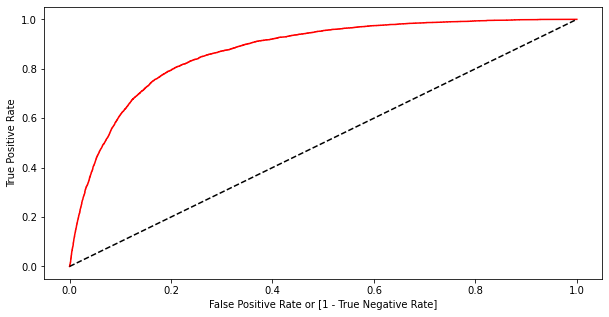

In [78]:
from sklearn.metrics import roc_curve,roc_auc_score
fpr, tpr, thresholds = roc_curve(y, logistic_model.predict_proba (x)[:,1])

auc = roc_auc_score(y_train,y_pred_train)
print(auc)

import matplotlib.pyplot as plt
plt.plot(fpr, tpr, color='red', label='logit model ( area  = %0.2f)'%auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')

## MODEL OPTIMIZATION TECHNIQUES
## 1. STANDARDIZE AND CHECK THE ACCURACY

In [79]:
from sklearn.preprocessing import StandardScaler
std_scaler = StandardScaler()
scaled_X = std_scaler.fit_transform(x)
scaled_X

array([[ 1.60696496, -0.10381968, -0.27576178, ..., -0.25194037,
         0.44489814, -0.47535364],
       [ 0.28852927,  1.42400783,  1.3683719 , ..., -0.25194037,
         0.44489814, -0.47535364],
       [-0.74738448, -0.71495069, -0.27576178, ..., -0.25194037,
         0.44489814, -0.47535364],
       ...,
       [ 2.92540065,  0.20174582, -0.27576178, ...,  1.05047333,
        -0.56617504,  2.01633311],
       [ 1.51279098, -1.02051619, -0.27576178, ..., -0.25194037,
         0.44489814,  2.01633311],
       [-0.37068857, -0.71495069, -0.27576178, ...,  4.52357654,
        -1.57724822,  2.01633311]])

In [80]:
X1_train,X1_test,y1_train,y1_test = train_test_split(scaled_X,y,test_size=0.20,random_state=123)

In [81]:
logistic_model.fit(X1_train,y1_train)

LogisticRegression(penalty='l1', solver='liblinear')

In [82]:
%%time
y1_pred_train = logistic_model.predict(X1_train)

Wall time: 2.99 ms


In [83]:
accuracy_score(y1_train,y1_pred_train)

0.8912021676620216

In [84]:
y1_pred_test = logistic_model.predict(X1_test)
accuracy_score(y1_test,y1_pred_test)

0.8903018909653876

In [85]:
confusion_matrix(y1_train,y1_pred_train)

array([[31329,   607],
       [ 3328,   904]], dtype=int64)

In [86]:
print(classification_report(y1_test,y1_pred_test))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      7986
           1       0.59      0.21      0.31      1057

    accuracy                           0.89      9043
   macro avg       0.75      0.59      0.62      9043
weighted avg       0.87      0.89      0.87      9043



0.5943636344681718


Text(0, 0.5, 'True Positive Rate')

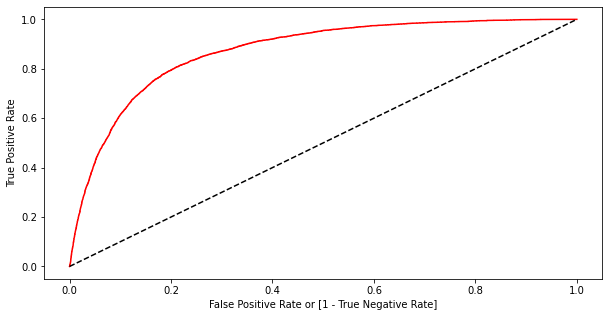

In [87]:
fpr, tpr, thresholds = roc_curve(y, logistic_model.predict_proba (scaled_X)[:,1])

auc = roc_auc_score(y1_test,y1_pred_test)
print(auc)


plt.plot(fpr, tpr, color='red', label='logit model ( area  = %0.2f)'%auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
plt.ylabel('True Positive Rate')

## Feature Importance
### You can get the feature importance of each feature of your dataset by using the feature importance property of the model.

#### Feature importance gives you a score for each feature of your data, the higher the score more important or relevant is the feature towards your output variable.

#### Feature importance is an inbuilt class that comes with Tree Based Classifiers, we will be using Extra Tree Classifier for extracting the top 10 features for the dataset.

In [88]:
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(x,y)

ExtraTreesClassifier()

In [89]:
print(model.feature_importances_)

[0.09770907 0.05916303 0.02591098 0.03543262 0.00283151 0.09141068
 0.02324067 0.01063823 0.02509177 0.09715586 0.25292319 0.05814067
 0.03923963 0.02593827 0.06046843 0.09470538]


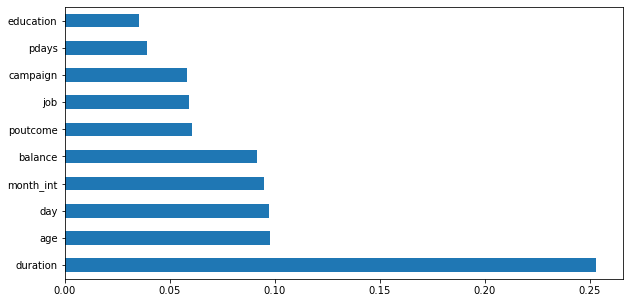

In [90]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=x.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

### Result

In [91]:
print('Accuracy score :\n',accuracy_score(y1_test,y1_pred_test))

Accuracy score :
 0.8903018909653876


In [92]:
from imblearn.combine import SMOTETomek

In [ ]:
yes= df3[df3['subs']==1]

no = df3[df3['Class']==0]

In [101]:
df3.columns[subscription]

NameError: name 'subscription' is not defined